# Download Kvasir-SEG from Kaggle

In [1]:
!pip install -q ultralytics kagglehub

import os
from pathlib import Path
import kagglehub

DATA_ROOT = Path(
    kagglehub.dataset_download("debeshjha1/kvasirseg")
)

print(f"Dataset downloaded to:\n{DATA_ROOT}")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 72.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.4/65.4 kB 6.3 MB/s eta 0:00:00
Using Colab cache for faster access to the 'kvasirseg' dataset.
Dataset downloaded to:
/kaggle/input/kvasirseg


# Import Libraries

In [2]:
import os
import cv2
import csv
import shutil
import random
import yaml
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split
from ultralytics import YOLO

import torch
print('PyTorch version :', torch.__version__)
print('GPU available   :', torch.cuda.is_available())
if torch.cuda.is_available():
  print('GPU name        :', torch.cuda.get_device_name(0))

Creating new Ultralytics Settings v0.0.7 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart#ultralytics-settings.
PyTorch version : 2.11.0+cu128
GPU available   : True
GPU name        : Tesla T4


# Locate the dataset and Inspect dataset structure

In [3]:
image_dirs = [
    p for p in DATA_ROOT.rglob("images")
    if p.is_dir()
]

if not image_dirs:
    raise FileNotFoundError(
        f"Could not find an 'images' directory under:\n{DATA_ROOT}"
    )

IMAGE_DIR = image_dirs[0]
DATASET_DIR = IMAGE_DIR.parent

print(f"\nDataset directory : {DATASET_DIR}")
print(f"Images directory  : {IMAGE_DIR}")


print("\nDataset contents:")

for item in sorted(DATASET_DIR.iterdir()):
    item_type = "dir" if item.is_dir() else "file"
    print(f"  {item.name} ({item_type})")

#Basic validation


assert IMAGE_DIR.is_dir(), "Images directory was not found."

image_files = [
    p for p in IMAGE_DIR.iterdir()
    if p.suffix.lower() in {".jpg", ".jpeg", ".png"}
]

print(f"\nNumber of images found: {len(image_files)}")

assert len(image_files) > 0, "No image files were found."

print("\nCell 1 completed successfully.")


Dataset directory : /kaggle/input/kvasirseg/Kvasir-SEG/Kvasir-SEG
Images directory  : /kaggle/input/kvasirseg/Kvasir-SEG/Kvasir-SEG/images

Dataset contents:
  1911.07069.pdf (file)
  annotated_images (dir)
  bbox (dir)
  images (dir)
  masks (dir)

Number of images found: 1000

Cell 1 completed successfully.


# Inspect bounding-box annotations

In [4]:
IMAGE_DIR = Path(IMAGE_DIR)
BBOX_DIR = DATASET_DIR / "bbox"
MASKS_DIR = DATASET_DIR / "masks"
assert BBOX_DIR.is_dir(), f"Bounding-box directory not found: {BBOX_DIR}"
assert MASKS_DIR.is_dir(), f"Mask directory not found: {MASKS_DIR}"


image_files = sorted([
    p for p in IMAGE_DIR.iterdir()
    if p.suffix.lower() in {".jpg", ".jpeg", ".png"}
])

bbox_files = sorted([
    p for p in BBOX_DIR.iterdir()
    if p.suffix.lower() == ".csv"
])

mask_files = sorted([
    p for p in MASKS_DIR.iterdir()
    if p.suffix.lower() in {".jpg", ".jpeg", ".png"}
])

print("Images       :", len(image_files))
print("BBox files   :", len(bbox_files))
print("Mask files   :", len(mask_files))

#Show sample files

print("\nSample image:")
print(" ", image_files[0].name)
print("\nSample bbox file:")
print(" ", bbox_files[0].name)
print("\nSample mask file:")
print(" ", mask_files[0].name)
sample_bbox = bbox_files[0]
print(f"\nContents of {sample_bbox.name}:\n")
with open(sample_bbox, "r") as f:
    print(f.read())

assert len(image_files) == 1000, (
    f"Expected 1000 images, found {len(image_files)}"
)

assert len(bbox_files) == len(image_files), (
    f"Image/bbox mismatch: {len(image_files)} images vs "
    f"{len(bbox_files)} bbox files"
)

assert len(mask_files) == len(image_files), (
    f"Image/mask mismatch: {len(image_files)} images vs "
    f"{len(mask_files)} masks"
)

print("\nAnnotation structure verified successfully.")


Images       : 1000
BBox files   : 1000
Mask files   : 1000

Sample image:
  cju0qkwl35piu0993l0dewei2.jpg

Sample bbox file:
  cju0qkwl35piu0993l0dewei2.csv

Sample mask file:
  cju0qkwl35piu0993l0dewei2.jpg

Contents of cju0qkwl35piu0993l0dewei2.csv:

class_name,xmin,ymin,xmax,ymax
polyp,38,5,430,338


Annotation structure verified successfully.


# Visualize Ground-Truth Bounding Boxes

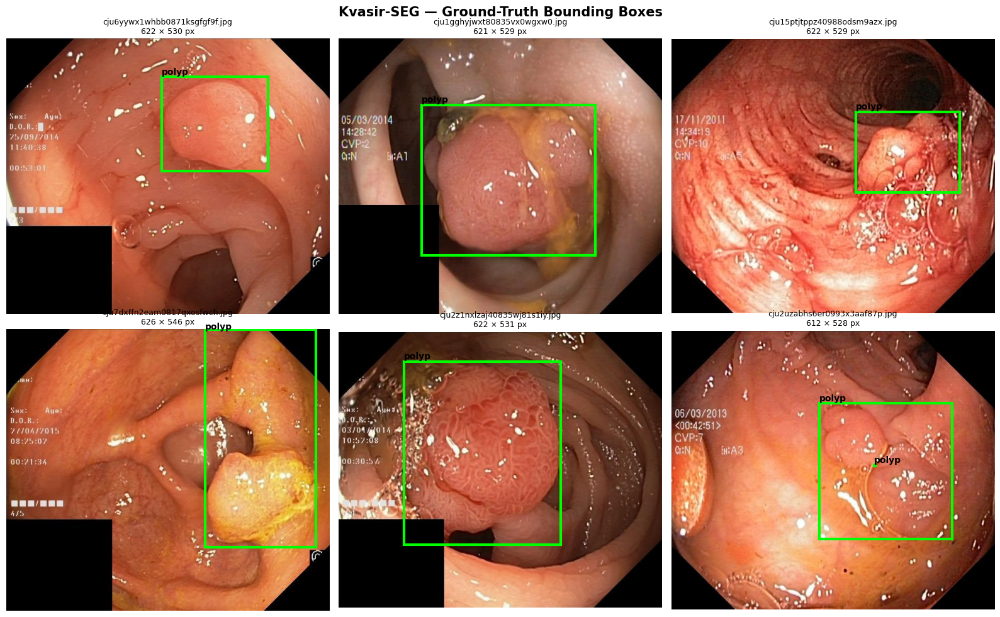

In [5]:
import random
import csv
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches

random.seed(42)
sample_images = random.sample(image_files, 6)
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
fig.suptitle(
    "Kvasir-SEG — Ground-Truth Bounding Boxes",
    fontsize=15,
    fontweight="bold"
)
axes = axes.flatten()


for i, image_path in enumerate(sample_images):

    # Read image
    img = cv2.imread(str(image_path))
    if img is None:
        raise ValueError(f"Could not read image: {image_path}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    height, width = img.shape[:2]

    csv_path = BBOX_DIR / f"{image_path.stem}.csv"
    if not csv_path.exists():
        raise FileNotFoundError(
            f"Bounding-box annotation not found:\n{csv_path}"
        )

    # Read CSV
    with open(csv_path, "r") as f:
        reader = csv.DictReader(f)
        rows = list(reader)

    if len(rows) == 0:
        raise ValueError(f"No bounding box found in {csv_path}")

    # Draw every bounding box in the annotation file
    for row in rows:

        xmin = float(row["xmin"])
        ymin = float(row["ymin"])
        xmax = float(row["xmax"])
        ymax = float(row["ymax"])
        assert 0 <= xmin <= width, (f"Invalid xmin in {csv_path.name}")
        assert 0 <= xmax <= width, (f"Invalid xmax in {csv_path.name}")
        assert 0 <= ymin <= height, (f"Invalid ymin in {csv_path.name}")
        assert 0 <= ymax <= height, (f"Invalid ymax in {csv_path.name}")
        assert xmax > xmin, (f"Invalid box width in {csv_path.name}")
        assert ymax > ymin, (f"Invalid box height in {csv_path.name}")


        rect = patches.Rectangle(
            (xmin, ymin),
            xmax - xmin,
            ymax - ymin,
            linewidth=3,
            edgecolor="lime",
            facecolor="none"
        )

        axes[i].add_patch(rect)

        # Class label
        axes[i].text(
            xmin,
            max(0, ymin - 5),
            row["class_name"],
            fontsize=10,
            fontweight="bold"
        )

    # Display image
    axes[i].imshow(img)

    axes[i].set_title(
        f"{image_path.name}\n{width} × {height} px",
        fontsize=9
    )

    axes[i].axis("off")

plt.tight_layout()
plt.show()

# Convert Kvasir CSV → YOLO Format
> Kvasir CSV: `class_name, xmin, ymin, xmax, ymax` (absolute pixels)  
> YOLO txt: `class cx cy w h` (normalized 0-1, center-based)

In [6]:
def read_bbox_csv(csv_path, img_w, img_h):
    """
    Read Kvasir-SEG bounding-box CSV and convert
    absolute pixel coordinates to YOLO format.

    Kvasir CSV:
        class_name, xmin, ymin, xmax, ymax

    YOLO format:
        class_id, center_x, center_y, width, height

    YOLO coordinates are normalized to [0, 1].
    """

    yolo_annotations = []

    with open(csv_path, "r") as f:
        reader = csv.DictReader(f)
        rows = list(reader)

    if not rows:
        raise ValueError(f"No annotations found in: {csv_path}")

    for row in rows:
        # Read bounding box
        x1 = float(row["xmin"])
        y1 = float(row["ymin"])
        x2 = float(row["xmax"])
        y2 = float(row["ymax"])

        # Validate pixel coordinates
        if not (0 <= x1 < x2 <= img_w):
            raise ValueError(
                f"Invalid x coordinates in {csv_path}: "
                f"{x1}, {x2} for image width {img_w}"
            )

        if not (0 <= y1 < y2 <= img_h):
            raise ValueError(
                f"Invalid y coordinates in {csv_path}: "
                f"{y1}, {y2} for image height {img_h}"
            )
        box_w = x2 - x1
        box_h = y2 - y1
        center_x = (x1 + x2) / 2
        center_y = (y1 + y2) / 2
        center_x /= img_w
        center_y /= img_h
        box_w /= img_w
        box_h /= img_h
        values = [center_x, center_y, box_w, box_h]

        if not all(0 <= value <= 1 for value in values):
            raise ValueError(
                f"Normalized YOLO coordinates outside [0,1] "
                f"in {csv_path}: {values}"
            )

        class_id = 0  # polyp

        yolo_line = (
            f"{class_id} "
            f"{center_x:.6f} "
            f"{center_y:.6f} "
            f"{box_w:.6f} "
            f"{box_h:.6f}"
        )

        yolo_annotations.append(yolo_line)

    return yolo_annotations

In [7]:

test_image = image_files[0]
test_img = cv2.imread(str(test_image))
if test_img is None:
    raise ValueError(f"Could not read image: {test_image}")

img_h, img_w = test_img.shape[:2]
test_csv = BBOX_DIR / f"{test_image.stem}.csv"
yolo_lines = read_bbox_csv(
    test_csv,
    img_w,
    img_h
)

print("Image       :", test_image.name)
print("Image size  :", f"{img_w} × {img_h}")
print("CSV         :", test_csv.name)
print("\nYOLO annotation:")

for line in yolo_lines:
    print(line)
print("\nFormat:")
print("class_id center_x center_y width height")
print("class 0 = polyp")

Image       : cju0qkwl35piu0993l0dewei2.jpg
Image size  : 622 × 529
CSV         : cju0qkwl35piu0993l0dewei2.csv

YOLO annotation:
0 0.376206 0.324197 0.630225 0.629490

Format:
class_id center_x center_y width height
class 0 = polyp


# Create Train / Validation / Test Splits

In [10]:
from sklearn.model_selection import train_test_split

all_keys = sorted([
    p.stem
    for p in Path(IMAGE_DIR).iterdir()
    if p.suffix.lower() == ".jpg"
])

print(f"Total images: {len(all_keys)}")

assert len(all_keys) == 1000, (
    f"Expected 1000 images, found {len(all_keys)}"
)

train_keys, temp_keys = train_test_split(
    all_keys,
    test_size=0.30,
    random_state=42
)

val_keys, test_keys = train_test_split(
    temp_keys,
    test_size=0.50,
    random_state=42
)

print("\nDataset split:")
print(f"Train : {len(train_keys)} images")
print(f"Val   : {len(val_keys)} images")
print(f"Test  : {len(test_keys)} images")

assert len(train_keys) == 700
assert len(val_keys) == 150
assert len(test_keys) == 150

train_set = set(train_keys)
val_set = set(val_keys)
test_set = set(test_keys)

assert train_set.isdisjoint(val_set)
assert train_set.isdisjoint(test_set)
assert val_set.isdisjoint(test_set)

print("\n✓ No image overlap between splits.")
print("✓ Train/Val/Test split created successfully.")

Total images: 1000

Dataset split:
Train : 700 images
Val   : 150 images
Test  : 150 images

✓ No image overlap between splits.
✓ Train/Val/Test split created successfully.


# Clean and Rebuild YOLO Dataset

In [11]:
from pathlib import Path
import shutil
import cv2

BASE = Path("/content/dataset")
if BASE.exists():
    print(f"Removing previous dataset: {BASE}")
    shutil.rmtree(BASE)

for split in ["train", "val", "test"]:

    (BASE / "images" / split).mkdir(
        parents=True,
        exist_ok=True
    )

    (BASE / "labels" / split).mkdir(
        parents=True,
        exist_ok=True
    )

print("Clean YOLO directory structure created.")

def build_split(keys, split_name):

    image_output = BASE / "images" / split_name
    label_output = BASE / "labels" / split_name

    for key in keys:

        img_path = Path(IMAGE_DIR) / f"{key}.jpg"
        csv_path = Path(BBOX_DIR) / f"{key}.csv"
        if not img_path.exists():
            raise FileNotFoundError(
                f"Image not found:\n{img_path}"
            )

        if not csv_path.exists():
            raise FileNotFoundError(
                f"Bounding-box CSV not found:\n{csv_path}"
            )

        img = cv2.imread(str(img_path))
        if img is None:
            raise ValueError(
                f"Could not read image:\n{img_path}"
            )

        height, width = img.shape[:2]
        yolo_lines = read_bbox_csv(
            csv_path,
            width,
            height
        )
        shutil.copy2(
            img_path,
            image_output / f"{key}.jpg"
        )

        label_path = (
            label_output / f"{key}.txt"
        )

        with open(label_path, "w") as f:

            for line in yolo_lines:
                f.write(line + "\n")


print("\nBuilding clean YOLO dataset...")
build_split(train_keys, "train")
build_split(val_keys, "val")
build_split(test_keys, "test")

print("\n" + "=" * 65)
print("FINAL YOLO DATASET")
print("=" * 65)

expected_counts = {
    "train": len(train_keys),
    "val": len(val_keys),
    "test": len(test_keys)
}

for split in ["train", "val", "test"]:

    image_count = len(
        list(
            (BASE / "images" / split).glob("*.jpg")
        )
    )

    label_count = len(
        list(
            (BASE / "labels" / split).glob("*.txt")
        )
    )

    expected = expected_counts[split]

    print(
        f"{split:5s} → "
        f"images: {image_count:3d} | "
        f"labels: {label_count:3d} | "
        f"expected: {expected:3d}"
    )

    assert image_count == expected, (
        f"{split}: expected {expected}, "
        f"found {image_count}"
    )

    assert label_count == expected, (
        f"{split}: expected {expected}, "
        f"found {label_count}"
    )


print("\n" + "=" * 65)
print("✓ YOLO DATASET REBUILT SUCCESSFULLY")
print("=" * 65)

Removing previous dataset: /content/dataset
Clean YOLO directory structure created.

Building clean YOLO dataset...

FINAL YOLO DATASET
train → images: 700 | labels: 700 | expected: 700
val   → images: 150 | labels: 150 | expected: 150
test  → images: 150 | labels: 150 | expected: 150

✓ YOLO DATASET REBUILT SUCCESSFULLY


# Create YOLO Dataset Configuration

In [12]:
import yaml

# Absolute path to our generated YOLO dataset
DATASET_PATH = BASE.resolve()

dataset_yaml = {
    "path": str(DATASET_PATH),
    "train": "images/train",
    "val": "images/val",
    "test": "images/test",
    "nc": 1,
    "names": {
        0: "polyp"
    }
}

yaml_path = Path("kvasir_detection.yaml")

with open(yaml_path, "w") as f:
    yaml.dump(
        dataset_yaml,
        f,
        sort_keys=False,
        default_flow_style=False
    )

print("Dataset YAML:")
print("-" * 50)

with open(yaml_path, "r") as f:
    print(f.read())

print("-" * 50)
print(f"YAML path: {yaml_path.resolve()}")
print("dataset.yaml ready.")

Dataset YAML:
--------------------------------------------------
path: /content/dataset
train: images/train
val: images/val
test: images/test
nc: 1
names:
  0: polyp

--------------------------------------------------
YAML path: /content/kvasir_detection.yaml
dataset.yaml ready.


# Experimental Configuration

In [18]:
MODELS = {
    "YOLOv9s": "yolov9s.pt",
    "YOLOv10s": "yolov10s.pt",
    "YOLO11s": "yolo11s.pt",
}

IMG_SIZE = 640
EPOCHS = 80
BATCH_SIZE = 8
PATIENCE = 20
LR0 = None
LRF = None
CONF_THRESH = 0.25
IOU_THRESH = 0.45
SEED = 42

print("=" * 60)
print("YOLO MODEL COMPARISON EXPERIMENT")
print("=" * 60)

print("\nModels:")
for i, (name, weights) in enumerate(MODELS.items(), start=1):
    print(f"  {i}. {name:8s} → {weights}")

print("\nCommon training configuration:")
print(f"  Image size     : {IMG_SIZE} × {IMG_SIZE}")
print(f"  Epochs         : {EPOCHS}")
print(f"  Batch size     : {BATCH_SIZE}")
print(f"  Learning rate  : Ultralytics defaults")
print(f"  Early stopping : {PATIENCE} epochs")
print(f"  Random seed    : {SEED}")

print("\nEvaluation configuration:")
print(f"  Confidence threshold : {CONF_THRESH}")
print(f"  IoU threshold        : {IOU_THRESH}")

print("\nTotal models:", len(MODELS))

YOLO MODEL COMPARISON EXPERIMENT

Models:
  1. YOLOv9s  → yolov9s.pt
  2. YOLOv10s → yolov10s.pt
  3. YOLO11s  → yolo11s.pt

Common training configuration:
  Image size     : 640 × 640
  Epochs         : 80
  Batch size     : 8
  Learning rate  : Ultralytics defaults
  Early stopping : 20 epochs
  Random seed    : 42

Evaluation configuration:
  Confidence threshold : 0.25
  IoU threshold        : 0.45

Total models: 3


# Verify YOLO Models

In [19]:
from ultralytics import YOLO
import gc
import torch

model_info = {}

print("=" * 70)
print("VERIFYING YOLO MODEL CHECKPOINTS")
print("=" * 70)

for model_name, weights in MODELS.items():

    print(f"\nLoading {model_name} ({weights})...")

    try:
        model = YOLO(weights)
        total_params = sum(
            p.numel()
            for p in model.model.parameters()
        )
        model_info[model_name] = {
            "weights": weights,
            "parameters": total_params
        }

        print("  ✓ Loaded successfully")
        print(f"  Parameters: {total_params:,}")
        del model
        gc.collect()

        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    except Exception as e:

        print(f"  ✗ Failed to load {weights}")
        print(f"  Error: {e}")

print("\n" + "=" * 70)
print("MODEL SUMMARY")
print("=" * 70)

for name, info in model_info.items():

    print(
        f"{name:9s} | "
        f"{info['weights']:12s} | "
        f"{info['parameters']:,} parameters"
    )

print(
    f"\nSuccessfully loaded: "
    f"{len(model_info)}/{len(MODELS)} models"
)

# ------------------------------------------------------------
# Final validation
# ------------------------------------------------------------

assert len(model_info) == len(MODELS), (
    "One or more YOLO checkpoints could not be loaded. "
    "Fix the checkpoint names before training."
)

print("\n✓ All three models are available for training.")

VERIFYING YOLO MODEL CHECKPOINTS

Loading YOLOv9s (yolov9s.pt)...
  ✓ Loaded successfully
  Parameters: 7,318,368

Loading YOLOv10s (yolov10s.pt)...
  ✓ Loaded successfully
  Parameters: 8,128,272

Loading YOLO11s (yolo11s.pt)...
  ✓ Loaded successfully
  Parameters: 9,458,752

MODEL SUMMARY
YOLOv9s   | yolov9s.pt   | 7,318,368 parameters
YOLOv10s  | yolov10s.pt  | 8,128,272 parameters
YOLO11s   | yolo11s.pt   | 9,458,752 parameters

Successfully loaded: 3/3 models

✓ All three models are available for training.


# Train


In [20]:
from ultralytics import YOLO
import gc
import torch


PROJECT_NAME = "ENDOX_runs"

# Store information about each experiment
training_results = {}

for model_name, weights in MODELS.items():

    print("\n" + "=" * 70)
    print(f"STARTING TRAINING: {model_name}")
    print(f"Checkpoint: {weights}")
    print("=" * 70)


    model = YOLO(weights)
    total_params = sum(
        p.numel()
        for p in model.model.parameters()
    )

    print(f"Parameters: {total_params:,}")

    results = model.train(

        # Dataset
        data=str(yaml_path),

        # Common training settings
        epochs=EPOCHS,
        imgsz=IMG_SIZE,
        batch=BATCH_SIZE,
        patience=PATIENCE,

        # Reproducibility
        seed=SEED,

        # Use standard augmentation
        augment=True,

        # Save results
        save=True,

        # Separate folder for each model
        project=PROJECT_NAME,
        name=model_name,

        verbose=True
    )

    training_results[model_name] = {
        "weights": weights,
        "parameters": total_params,
        "results": results,
        "best_model": (
            f"{PROJECT_NAME}/{model_name}/weights/best.pt"
        )
    }

    print("\nTraining complete!")
    print(
        f"Best model: "
        f"{PROJECT_NAME}/{model_name}/weights/best.pt"
    )
    del model
    gc.collect()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

print("\n" + "=" * 70)
print("ALL TRAINING COMPLETED")
print("=" * 70)

for model_name, info in training_results.items():

    print(
        f"{model_name:9s} → "
        f"{info['best_model']}"
    )


STARTING TRAINING: YOLOv9s
Checkpoint: yolov9s.pt
Parameters: 7,318,368
Ultralytics 8.4.129 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=kvasir_detection.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=80, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov9s.pt, momentum=0.937, mos

# Plot Training Curves

Expected: ENDOX_runs/YOLOv9s/results.csv
Expected: ENDOX_runs/YOLOv10s/results.csv
Expected: ENDOX_runs/YOLO11s/results.csv
LOADING TRAINING RESULTS
✓ YOLOv9s: 80 epochs
✓ YOLOv10s: 80 epochs
✓ YOLO11s: 80 epochs

AVAILABLE METRICS

YOLOv9s:
   ['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']

YOLOv10s:
   ['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']

YOLO11s:
   ['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']


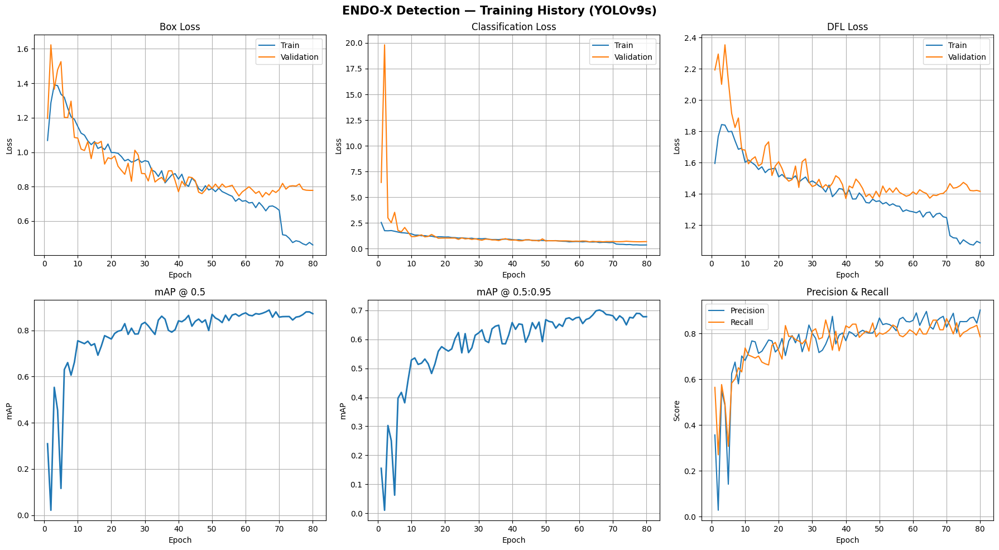

✓ Saved: /content/runs/detect/ENDOX_runs/YOLOv9s_training_curves.png


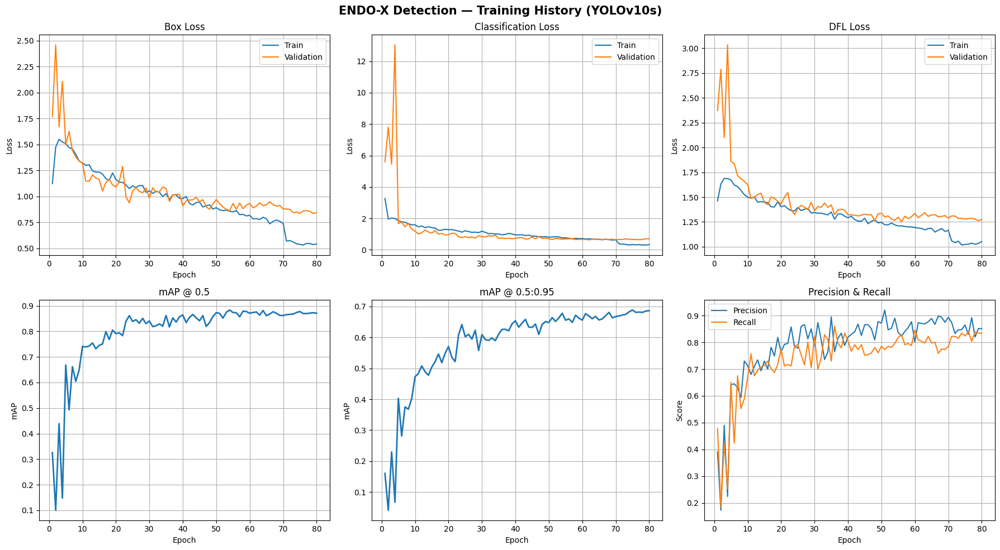

✓ Saved: /content/runs/detect/ENDOX_runs/YOLOv10s_training_curves.png


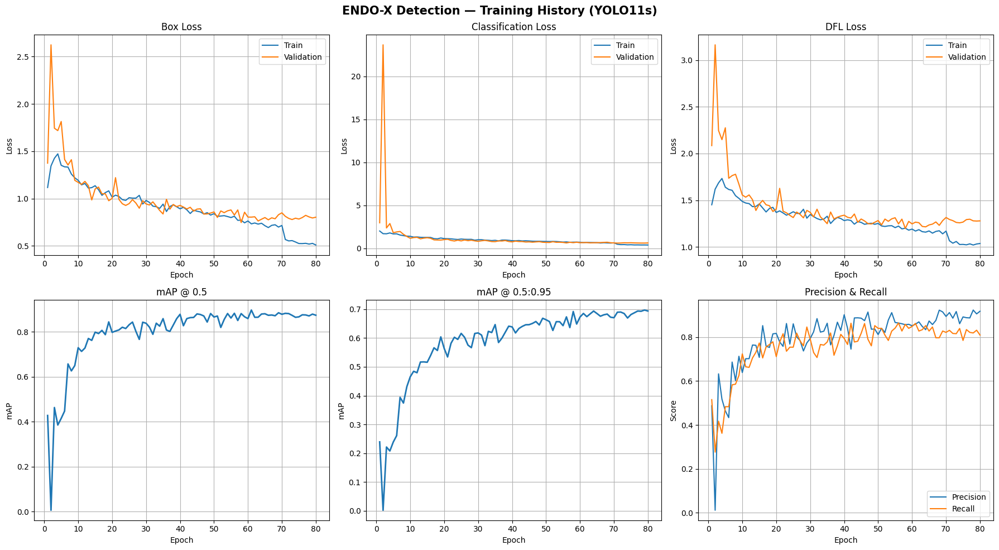

✓ Saved: /content/runs/detect/ENDOX_runs/YOLO11s_training_curves.png

TRAINING CURVES COMPLETED


In [23]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

# ------------------------------------------------------------
# Correct Ultralytics runs directory
# ------------------------------------------------------------

RUNS_DIR = Path("/content/runs/detect/ENDOX_runs")

print("=" * 70)
print("LOADING TRAINING RESULTS")
print("=" * 70)

model_dfs = {}

# ------------------------------------------------------------
# Load results.csv
# ------------------------------------------------------------

for model_name in MODELS.keys():

    results_path = RUNS_DIR / model_name / "results.csv"

    if not results_path.exists():
        print(f"⚠ Results not found: {model_name}")
        continue

    df = pd.read_csv(results_path)

    # Remove spaces from column names
    df.columns = df.columns.str.strip()

    model_dfs[model_name] = df

    print(
        f"✓ {model_name}: "
        f"{len(df)} epochs"
    )

# ------------------------------------------------------------
# Show available columns
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("AVAILABLE METRICS")
print("=" * 70)

for model_name, df in model_dfs.items():

    print(f"\n{model_name}:")
    print("  ", list(df.columns))


# ============================================================
# Plot each model
# ============================================================

for model_name, df in model_dfs.items():

    epochs = df["epoch"]

    fig, axes = plt.subplots(
        2,
        3,
        figsize=(18, 10)
    )

    fig.suptitle(
        f"ENDO-X Detection — Training History ({model_name})",
        fontsize=15,
        fontweight="bold"
    )

    # ========================================================
    # 1. Box Loss
    # ========================================================

    if "train/box_loss" in df.columns:

        axes[0, 0].plot(
            epochs,
            df["train/box_loss"],
            label="Train"
        )

    if "val/box_loss" in df.columns:

        axes[0, 0].plot(
            epochs,
            df["val/box_loss"],
            label="Validation"
        )

    axes[0, 0].set_title("Box Loss")
    axes[0, 0].set_xlabel("Epoch")
    axes[0, 0].set_ylabel("Loss")
    axes[0, 0].legend()
    axes[0, 0].grid(True)

    # ========================================================
    # 2. Classification Loss
    # ========================================================

    if "train/cls_loss" in df.columns:

        axes[0, 1].plot(
            epochs,
            df["train/cls_loss"],
            label="Train"
        )

    if "val/cls_loss" in df.columns:

        axes[0, 1].plot(
            epochs,
            df["val/cls_loss"],
            label="Validation"
        )

    axes[0, 1].set_title("Classification Loss")
    axes[0, 1].set_xlabel("Epoch")
    axes[0, 1].set_ylabel("Loss")
    axes[0, 1].legend()
    axes[0, 1].grid(True)

    # ========================================================
    # 3. DFL Loss
    # ========================================================

    if "train/dfl_loss" in df.columns:

        axes[0, 2].plot(
            epochs,
            df["train/dfl_loss"],
            label="Train"
        )

    if "val/dfl_loss" in df.columns:

        axes[0, 2].plot(
            epochs,
            df["val/dfl_loss"],
            label="Validation"
        )

    axes[0, 2].set_title("DFL Loss")
    axes[0, 2].set_xlabel("Epoch")
    axes[0, 2].set_ylabel("Loss")
    axes[0, 2].legend()
    axes[0, 2].grid(True)

    # ========================================================
    # 4. mAP50
    # ========================================================

    if "metrics/mAP50(B)" in df.columns:

        axes[1, 0].plot(
            epochs,
            df["metrics/mAP50(B)"],
            linewidth=2
        )

    axes[1, 0].set_title("mAP @ 0.5")
    axes[1, 0].set_xlabel("Epoch")
    axes[1, 0].set_ylabel("mAP")
    axes[1, 0].grid(True)

    # ========================================================
    # 5. mAP50-95
    # ========================================================

    if "metrics/mAP50-95(B)" in df.columns:

        axes[1, 1].plot(
            epochs,
            df["metrics/mAP50-95(B)"],
            linewidth=2
        )

    axes[1, 1].set_title("mAP @ 0.5:0.95")
    axes[1, 1].set_xlabel("Epoch")
    axes[1, 1].set_ylabel("mAP")
    axes[1, 1].grid(True)

    # ========================================================
    # 6. Precision & Recall
    # ========================================================

    if "metrics/precision(B)" in df.columns:

        axes[1, 2].plot(
            epochs,
            df["metrics/precision(B)"],
            label="Precision"
        )

    if "metrics/recall(B)" in df.columns:

        axes[1, 2].plot(
            epochs,
            df["metrics/recall(B)"],
            label="Recall"
        )

    axes[1, 2].set_title("Precision & Recall")
    axes[1, 2].set_xlabel("Epoch")
    axes[1, 2].set_ylabel("Score")
    axes[1, 2].legend()
    axes[1, 2].grid(True)

    # ========================================================
    # Finish figure
    # ========================================================

    plt.tight_layout()

    output_path = (
        RUNS_DIR /
        f"{model_name}_training_curves.png"
    )

    plt.savefig(
        output_path,
        dpi=150,
        bbox_inches="tight"
    )

    plt.show()

    print(f"✓ Saved: {output_path}")

print("\n" + "=" * 70)
print("TRAINING CURVES COMPLETED")
print("=" * 70)

# Evaluate on Test Set

In [24]:
from ultralytics import YOLO
from pathlib import Path
import pandas as pd
import gc
import torch

# ------------------------------------------------------------
# Correct Ultralytics runs directory
# ------------------------------------------------------------

RUNS_DIR = Path("/content/runs/detect/ENDOX_runs")

evaluation_results = []

print("=" * 70)
print("EVALUATING ALL TRAINED MODELS ON THE TEST SET")
print("=" * 70)

# ------------------------------------------------------------
# Evaluate every model that has best.pt
# ------------------------------------------------------------

for model_name in MODELS.keys():

    best_path = (
        RUNS_DIR
        / model_name
        / "weights"
        / "best.pt"
    )

    print("\n" + "=" * 70)
    print(f"Evaluating: {model_name}")
    print(f"Weights: {best_path}")
    print("=" * 70)

    # --------------------------------------------------------
    # Check weights
    # --------------------------------------------------------

    if not best_path.exists():

        print(f"WARNING: best.pt not found for {model_name}")
        print("Skipping...")
        continue

    # --------------------------------------------------------
    # Load best model
    # --------------------------------------------------------

    model = YOLO(str(best_path))

    # --------------------------------------------------------
    # Evaluate ONLY on TEST set
    # --------------------------------------------------------

    metrics = model.val(
        data=str(yaml_path),
        split="test",
        imgsz=IMG_SIZE,
        conf=CONF_THRESH,
        iou=IOU_THRESH,
        verbose=True
    )

    # --------------------------------------------------------
    # Extract metrics
    # --------------------------------------------------------

    map50 = float(metrics.box.map50)
    map5095 = float(metrics.box.map)

    precision = float(metrics.box.mp)
    recall = float(metrics.box.mr)

    # --------------------------------------------------------
    # Calculate F1
    # --------------------------------------------------------

    if precision + recall > 0:

        f1 = (
            2 * precision * recall
            / (precision + recall)
        )

    else:

        f1 = 0.0

    # --------------------------------------------------------
    # Store results
    # --------------------------------------------------------

    evaluation_results.append({

        "Model": model_name,

        "mAP50": map50,

        "mAP50-95": map5095,

        "Precision": precision,

        "Recall": recall,

        "F1": f1
    })

    # --------------------------------------------------------
    # Print results
    # --------------------------------------------------------

    print("\n--- TEST RESULTS ---")

    print(
        f"mAP50       : "
        f"{map50:.4f} "
        f"({map50 * 100:.2f}%)"
    )

    print(
        f"mAP50-95    : "
        f"{map5095:.4f} "
        f"({map5095 * 100:.2f}%)"
    )

    print(
        f"Precision   : "
        f"{precision:.4f}"
    )

    print(
        f"Recall      : "
        f"{recall:.4f}"
    )

    print(
        f"F1          : "
        f"{f1:.4f}"
    )

    # --------------------------------------------------------
    # Free GPU memory
    # --------------------------------------------------------

    del model
    del metrics

    gc.collect()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()


# ============================================================
# Final Comparison Table
# ============================================================

results_df = pd.DataFrame(
    evaluation_results
)

print("\n" + "=" * 70)
print("FINAL TEST-SET MODEL COMPARISON")
print("=" * 70)

if len(results_df) == 0:

    print("No trained models were found.")

else:

    # Sort by mAP50-95
    results_df = results_df.sort_values(
        "mAP50-95",
        ascending=False
    ).reset_index(drop=True)

    display(
        results_df.style.format({

            "mAP50": "{:.4f}",

            "mAP50-95": "{:.4f}",

            "Precision": "{:.4f}",

            "Recall": "{:.4f}",

            "F1": "{:.4f}"
        })
    )

    # --------------------------------------------------------
    # Save CSV
    # --------------------------------------------------------

    comparison_path = (
        RUNS_DIR / "model_comparison_test.csv"
    )

    results_df.to_csv(
        comparison_path,
        index=False
    )

    print(
        f"\nComparison saved to:\n"
        f"{comparison_path}"
    )

EVALUATING ALL TRAINED MODELS ON THE TEST SET

Evaluating: YOLOv9s
Weights: /content/runs/detect/ENDOX_runs/YOLOv9s/weights/best.pt
Ultralytics 8.4.129 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLOv9s summary (fused): 197 layers, 7,167,475 parameters, 0 gradients, 26.7 GFLOPs
WARNING ⚠️ val: Slow image access detected (ping: 0.0±0.0 ms, read: 21.8±14.8 MB/s, size: 54.6 KB). Use local storage instead of remote/mounted storage for better performance. See https://docs.ultralytics.com/guides/model-training-tips
val: Scanning /content/dataset/labels/test... 150 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 150/150 544.3it/s 0.3s
val: New cache created: /content/dataset/labels/test.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 3.1it/s 3.2s
                   all        150        155      0.931      0.884      0.861      0.647
Speed: 3.9ms preprocess, 10.6ms inference, 0.0ms loss, 1.7ms pos

,Model,mAP50,mAP50-95,Precision,Recall,F1
0,YOLO11s,0.8919,0.6601,0.9071,0.8968,0.9019
1,YOLOv10s,0.8304,0.6556,0.9010,0.8323,0.8653
2,YOLOv9s,0.8613,0.6468,0.9307,0.8839,0.9067



Comparison saved to:
/content/runs/detect/ENDOX_runs/model_comparison_test.csv


# Visualize Predictions on Test Images

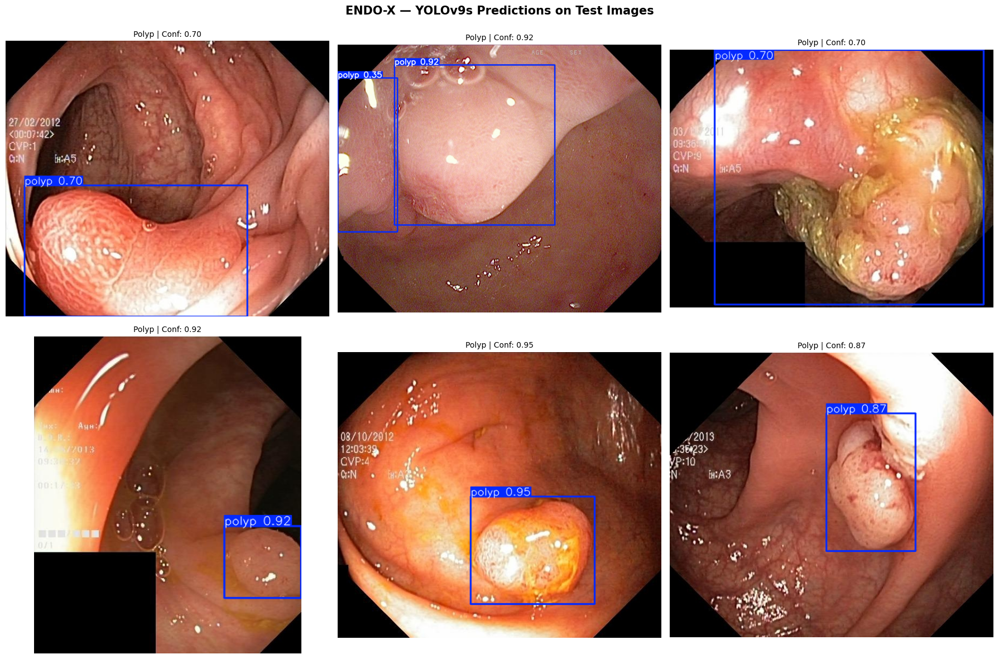

Saved: /content/runs/detect/ENDOX_runs/YOLOv9s_test_predictions.png


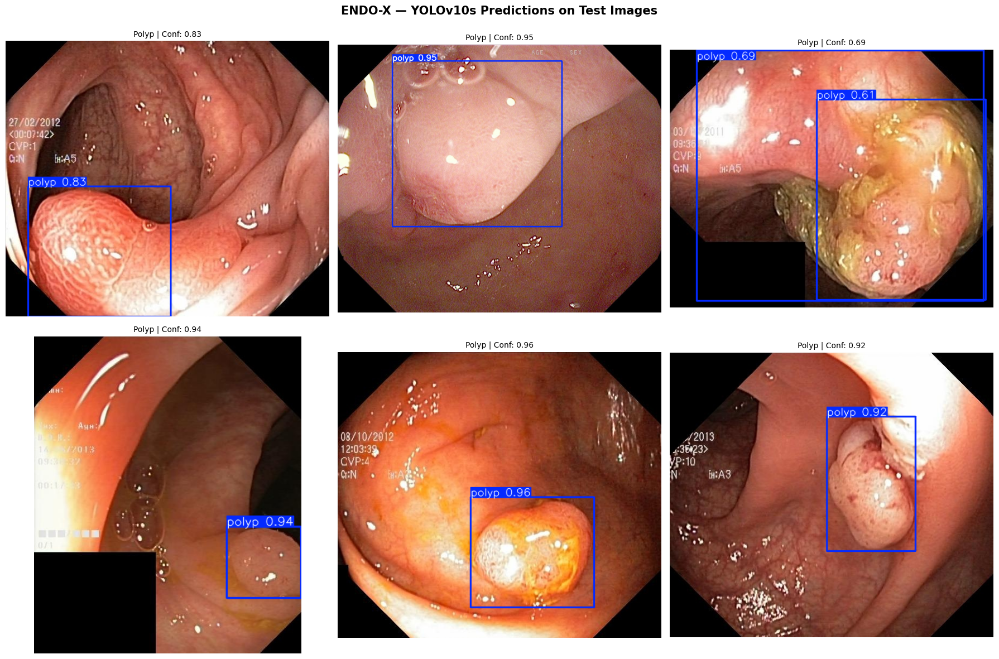

Saved: /content/runs/detect/ENDOX_runs/YOLOv10s_test_predictions.png


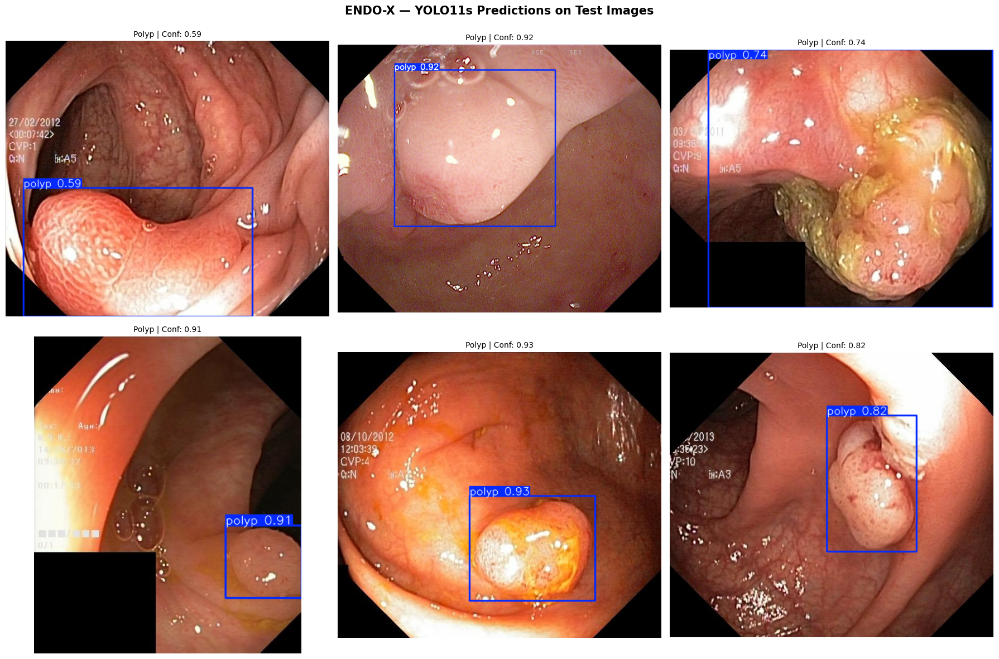

Saved: /content/runs/detect/ENDOX_runs/YOLO11s_test_predictions.png


In [25]:
test_img_dir = f'{BASE}/images/test'

test_images = random.sample(
    os.listdir(test_img_dir),
    6
)

for model_name in MODELS.keys():

    best_path = (
        RUNS_DIR
        / model_name
        / 'weights'
        / 'best.pt'
    )

    if not best_path.exists():
        print(f'Skipping {model_name}: best.pt not found')
        continue

    model = YOLO(str(best_path))

    fig, axes = plt.subplots(
        2, 3,
        figsize=(18, 12)
    )

    fig.suptitle(
        f'ENDO-X — {model_name} Predictions on Test Images',
        fontsize=15,
        fontweight='bold'
    )

    axes = axes.flatten()

    for i, fname in enumerate(test_images):

        img_path = os.path.join(
            test_img_dir,
            fname
        )

        result = model.predict(
            source=img_path,
            conf=CONF_THRESH,
            iou=IOU_THRESH,
            verbose=False
        )[0]

        plotted = result.plot()

        plotted = cv2.cvtColor(
            plotted,
            cv2.COLOR_BGR2RGB
        )

        boxes = result.boxes

        if len(boxes) > 0:

            conf_val = boxes.conf.max().item()

            title = (
                f'Polyp | '
                f'Conf: {conf_val:.2f}'
            )

        else:

            title = 'No detection'

        axes[i].imshow(plotted)
        axes[i].set_title(
            title,
            fontsize=10
        )
        axes[i].axis('off')

    plt.tight_layout()

    output_path = (
        RUNS_DIR /
        f'{model_name}_test_predictions.png'
    )

    plt.savefig(
        output_path,
        dpi=150,
        bbox_inches='tight'
    )

    plt.show()

    print(f'Saved: {output_path}')

    del model

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

In [22]:
from ultralytics import YOLO
from pathlib import Path
import pandas as pd

RUNS_DIR = Path("ENDOX_runs")

evaluation_results = []

print("=" * 70)
print("EVALUATING ALL MODELS ON THE TEST SET")
print("=" * 70)

for model_name in MODELS.keys():

    # --------------------------------------------------------
    # Path to best weights
    # --------------------------------------------------------

    best_path = (
        RUNS_DIR
        / model_name
        / "weights"
        / "best.pt"
    )

    print("\n" + "=" * 70)
    print(f"Evaluating: {model_name}")
    print(f"Weights: {best_path}")
    print("=" * 70)

    if not best_path.exists():
        print(f"WARNING: {best_path} not found.")
        continue

    # --------------------------------------------------------
    # Load best model
    # --------------------------------------------------------

    model = YOLO(str(best_path))

    # --------------------------------------------------------
    # Evaluate on TEST set
    # --------------------------------------------------------

    metrics = model.val(
        data=str(yaml_path),
        split="test",
        imgsz=IMG_SIZE,
        conf=CONF_THRESH,
        iou=IOU_THRESH,
        verbose=True
    )

    # --------------------------------------------------------
    # Extract metrics
    # --------------------------------------------------------

    map50 = metrics.box.map50
    map5095 = metrics.box.map
    precision = metrics.box.mp
    recall = metrics.box.mr

    # F1 score
    if precision + recall > 0:
        f1 = (
            2 * precision * recall
            / (precision + recall)
        )
    else:
        f1 = 0.0

    # --------------------------------------------------------
    # Store results
    # --------------------------------------------------------

    evaluation_results.append({
        "Model": model_name,
        "mAP50": map50,
        "mAP50-95": map5095,
        "Precision": precision,
        "Recall": recall,
        "F1": f1
    })

    # --------------------------------------------------------
    # Print results
    # --------------------------------------------------------

    print("\n─── Test Results ───")

    print(
        f"mAP @ 0.5      : "
        f"{map50:.4f} ({map50 * 100:.2f}%)"
    )

    print(
        f"mAP @ 0.5:0.95 : "
        f"{map5095:.4f} ({map5095 * 100:.2f}%)"
    )

    print(f"Precision      : {precision:.4f}")
    print(f"Recall         : {recall:.4f}")
    print(f"F1             : {f1:.4f}")

    # --------------------------------------------------------
    # Free memory
    # --------------------------------------------------------

    del model

# ------------------------------------------------------------
# Create comparison table
# ------------------------------------------------------------

results_df = pd.DataFrame(evaluation_results)

print("\n" + "=" * 70)
print("FINAL MODEL COMPARISON")
print("=" * 70)

display(
    results_df.style.format({
        "mAP50": "{:.4f}",
        "mAP50-95": "{:.4f}",
        "Precision": "{:.4f}",
        "Recall": "{:.4f}",
        "F1": "{:.4f}"
    })
)

EVALUATING ALL MODELS ON THE TEST SET

Evaluating: YOLOv9s
Weights: ENDOX_runs/YOLOv9s/weights/best.pt

Evaluating: YOLOv10s
Weights: ENDOX_runs/YOLOv10s/weights/best.pt

Evaluating: YOLO11s
Weights: ENDOX_runs/YOLO11s/weights/best.pt

FINAL MODEL COMPARISON


# Confidence Distribution Analysis

In [26]:
RUNS_DIR = Path("/content/runs/detect/ENDOX_runs")

results_df = results_df.sort_values(
    "mAP50-95",
    ascending=False
).reset_index(drop=True)

best_model_name = results_df.loc[0, "Model"]

best_weights = (
    RUNS_DIR
    / best_model_name
    / "weights"
    / "best.pt"
)

print(f"Best model: {best_model_name}")
print(f"Weights: {best_weights}")

assert best_weights.exists(), (
    f"Weights not found: {best_weights}"
)

best_model = YOLO(str(best_weights))

print("Best model loaded successfully.")

Best model: YOLO11s
Weights: /content/runs/detect/ENDOX_runs/YOLO11s/weights/best.pt
Best model loaded successfully.


Detected        : 146
Not detected    : 4
Detection rate  : 97.3%
Mean confidence : 0.8565


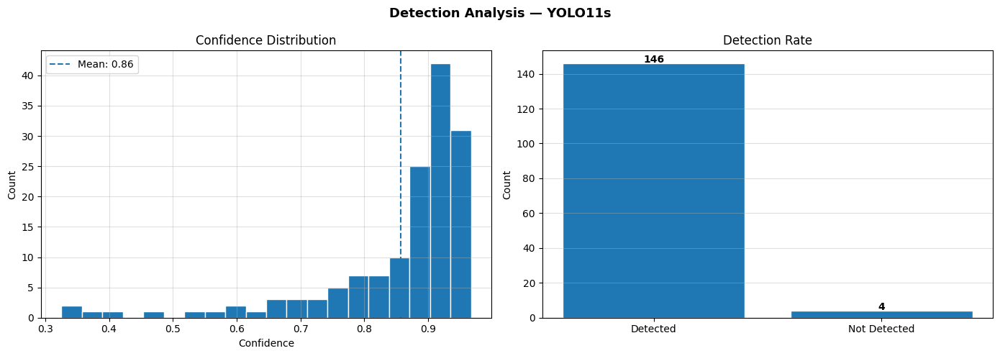

In [27]:
import numpy as np
import os
import matplotlib.pyplot as plt

all_confs = []
detected = 0
not_detected = 0

for fname in os.listdir(test_img_dir):

    img_path = os.path.join(test_img_dir, fname)

    result = best_model.predict(
        source=img_path,
        conf=CONF_THRESH,
        iou=IOU_THRESH,
        verbose=False
    )[0]

    boxes = result.boxes

    if len(boxes) > 0:
        all_confs.append(boxes.conf.max().item())
        detected += 1
    else:
        not_detected += 1

total_images = detected + not_detected

print(f"Detected        : {detected}")
print(f"Not detected    : {not_detected}")
print(f"Detection rate  : {detected / total_images * 100:.1f}%")

if all_confs:
    mean_conf = np.mean(all_confs)
    print(f"Mean confidence : {mean_conf:.4f}")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(
    f"Detection Analysis — {best_model_name}",
    fontsize=13,
    fontweight="bold"
)

if all_confs:

    axes[0].hist(
        all_confs,
        bins=20,
        edgecolor="white"
    )

    axes[0].axvline(
        mean_conf,
        linestyle="--",
        label=f"Mean: {mean_conf:.2f}"
    )

    axes[0].legend()

axes[0].set_title("Confidence Distribution")
axes[0].set_xlabel("Confidence")
axes[0].set_ylabel("Count")
axes[0].grid(True, alpha=0.4)

axes[1].bar(
    ["Detected", "Not Detected"],
    [detected, not_detected],
    edgecolor="white"
)

axes[1].set_title("Detection Rate")
axes[1].set_ylabel("Count")
axes[1].grid(True, alpha=0.4, axis="y")

for j, value in enumerate([detected, not_detected]):
    axes[1].text(
        j,
        value + 0.3,
        str(value),
        ha="center",
        fontweight="bold"
    )

plt.tight_layout()

plt.savefig(
    "confidence_analysis.png",
    dpi=150,
    bbox_inches="tight"
)

plt.show()

# Save Weights for ENDO-X


In [28]:
import shutil
from google.colab import files

output_model = "endox_polyp_detector.pt"

shutil.copy(
    best_weights,
    output_model
)

print(f"Saved: {output_model}")
print("Model selected based on highest test mAP50-95.")

files.download(output_model)

Saved: endox_polyp_detector.pt
Model selected based on highest test mAP50-95.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Test Single Image

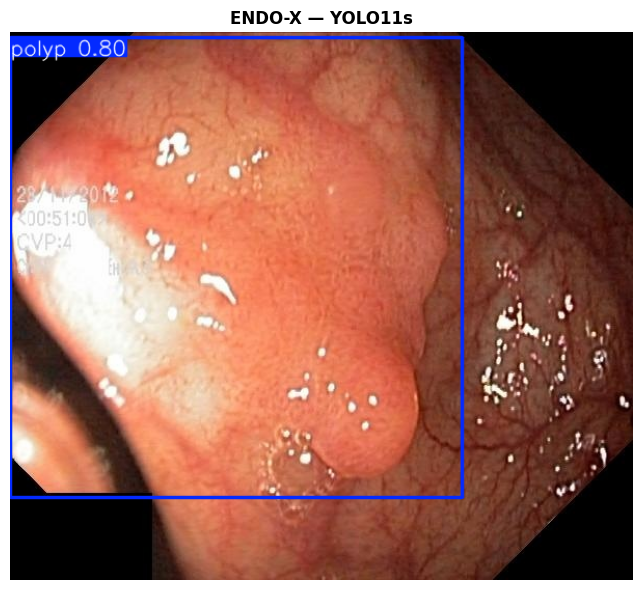

Class      : polyp
Confidence : 0.7951 (79.51%)
Box (xyxy) : x1=0.3 y1=5.8 x2=435.9 y2=448.3


In [29]:
demo_img = os.path.join(
    test_img_dir,
    os.listdir(test_img_dir)[0]
)

result = best_model.predict(
    source=demo_img,
    conf=CONF_THRESH,
    iou=IOU_THRESH,
    verbose=False
)[0]

plotted = result.plot()
plotted = cv2.cvtColor(
    plotted,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(8, 6))
plt.imshow(plotted)

plt.title(
    f"ENDO-X — {best_model_name}",
    fontweight="bold"
)

plt.axis("off")
plt.tight_layout()
plt.show()

boxes = result.boxes

if len(boxes) > 0:

    for box in boxes:

        xyxy = box.xyxy[0].tolist()
        conf = box.conf[0].item()

        print("Class      : polyp")
        print(
            f"Confidence : "
            f"{conf:.4f} ({conf * 100:.2f}%)"
        )

        print(
            f"Box (xyxy) : "
            f"x1={xyxy[0]:.1f} "
            f"y1={xyxy[1]:.1f} "
            f"x2={xyxy[2]:.1f} "
            f"y2={xyxy[3]:.1f}"
        )

else:

    print("No polyp detected.")

In [30]:
# ============================================================
# FINAL CELL — Save All ENDO-X YOLO Results to One ZIP
# ============================================================

import os
import shutil
from pathlib import Path
import pandas as pd

RUNS_DIR = Path("/content/runs/detect/ENDOX_runs")
BACKUP_DIR = Path("/content/ENDOX_final_results")
ZIP_PATH = Path("/content/ENDOX_final_results.zip")

if BACKUP_DIR.exists():
    shutil.rmtree(BACKUP_DIR)

BACKUP_DIR.mkdir(parents=True, exist_ok=True)

print("=" * 70)
print("COLLECTING ENDO-X YOLO RESULTS")
print("=" * 70)

# ------------------------------------------------------------
# 1. Copy all YOLO training runs
# ------------------------------------------------------------

if RUNS_DIR.exists():

    shutil.copytree(
        RUNS_DIR,
        BACKUP_DIR / "training_runs",
        dirs_exist_ok=True
    )

    print("✓ Training runs copied")

else:
    print("⚠ Training runs directory not found")

# ------------------------------------------------------------
# 2. Save final model comparison
# ------------------------------------------------------------

if "results_df" in globals():

    results_df.to_csv(
        BACKUP_DIR / "final_model_comparison.csv",
        index=False
    )

    print("✓ final_model_comparison.csv saved")

# ------------------------------------------------------------
# 3. Save training curves from generated PNGs
# ------------------------------------------------------------

if RUNS_DIR.exists():

    curve_files = list(
        RUNS_DIR.rglob("*training_curves*.png")
    )

    for file in curve_files:

        shutil.copy2(
            file,
            BACKUP_DIR / file.name
        )

    print(f"✓ Training curves copied: {len(curve_files)}")

# ------------------------------------------------------------
# 4. Save confidence analysis
# ------------------------------------------------------------

for file_name in [
    "confidence_analysis.png",
    "test_predictions.png"
]:

    file_path = Path("/content") / file_name

    if file_path.exists():

        shutil.copy2(
            file_path,
            BACKUP_DIR / file_name
        )

        print(f"✓ {file_name} copied")

# ------------------------------------------------------------
# 5. Save dataset YAML
# ------------------------------------------------------------

if "yaml_path" in globals():

    yaml_source = Path(yaml_path)

    if yaml_source.exists():

        shutil.copy2(
            yaml_source,
            BACKUP_DIR / "kvasir_detection.yaml"
        )

        print("✓ Dataset YAML copied")

# ------------------------------------------------------------
# 6. Save selected best model
# ------------------------------------------------------------

if "best_model_name" in globals():

    best_weights = (
        RUNS_DIR
        / best_model_name
        / "weights"
        / "best.pt"
    )

    if best_weights.exists():

        shutil.copy2(
            best_weights,
            BACKUP_DIR / "endox_polyp_detector.pt"
        )

        print(
            f"✓ Best model copied: {best_model_name}"
        )

else:

    print("⚠ best_model_name not found")

# ------------------------------------------------------------
# 7. Save model names
# ------------------------------------------------------------

if "MODELS" in globals():

    with open(
        BACKUP_DIR / "models_used.txt",
        "w"
    ) as f:

        for name, weights in MODELS.items():

            f.write(
                f"{name}: {weights}\n"
            )

    print("✓ models_used.txt saved")

# ------------------------------------------------------------
# 8. Save important configuration
# ------------------------------------------------------------

config = {}

for variable in [
    "EPOCHS",
    "IMG_SIZE",
    "BATCH_SIZE",
    "LR0",
    "LRF",
    "PATIENCE",
    "CONF_THRESH",
    "IOU_THRESH"
]:

    if variable in globals():

        config[variable] = globals()[variable]

if config:

    with open(
        BACKUP_DIR / "training_config.txt",
        "w"
    ) as f:

        for key, value in config.items():

            f.write(
                f"{key} = {value}\n"
            )

    print("✓ training_config.txt saved")

# ------------------------------------------------------------
# 9. Create README
# ------------------------------------------------------------

with open(
    BACKUP_DIR / "README.txt",
    "w"
) as f:

    f.write(
"""ENDO-X — YOLO Polyp Detection Results

Dataset:
Kvasir-SEG

Task:
Polyp object detection

Classes:
1 — polyp

This archive contains:

1. training_runs/
   Complete Ultralytics YOLO training results.

2. final_model_comparison.csv
   Test-set comparison of all trained models.

3. Training curves
   Loss, mAP, precision and recall plots.

4. confidence_analysis.png
   Confidence distribution and detection analysis.

5. test_predictions.png
   Example predictions on test images.

6. kvasir_detection.yaml
   YOLO dataset configuration.

7. endox_polyp_detector.pt
   Selected best YOLO checkpoint.

8. models_used.txt
   Models trained in the experiment.

9. training_config.txt
   Main training hyperparameters.
"""
    )

print("✓ README.txt saved")

# ------------------------------------------------------------
# 10. Show collected files
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("FILES INCLUDED")
print("=" * 70)

for path in sorted(BACKUP_DIR.rglob("*")):

    if path.is_file():

        size_mb = path.stat().st_size / (1024 ** 2)

        print(
            f"{path.relative_to(BACKUP_DIR)} "
            f"({size_mb:.2f} MB)"
        )

# ------------------------------------------------------------
# 11. Create ZIP
# ------------------------------------------------------------

if ZIP_PATH.exists():
    ZIP_PATH.unlink()

shutil.make_archive(
    str(ZIP_PATH.with_suffix("")),
    "zip",
    BACKUP_DIR
)

print("\n" + "=" * 70)
print("ZIP CREATED SUCCESSFULLY")
print("=" * 70)

print(f"\nZIP file:")
print(ZIP_PATH)

size_mb = ZIP_PATH.stat().st_size / (1024 ** 2)

print(f"ZIP size: {size_mb:.2f} MB")

# ------------------------------------------------------------
# 12. Download
# ------------------------------------------------------------

from google.colab import files

files.download(str(ZIP_PATH))

print("\n✓ Download started")

COLLECTING ENDO-X YOLO RESULTS
✓ Training runs copied
✓ final_model_comparison.csv saved
✓ Training curves copied: 3
✓ confidence_analysis.png copied
✓ Dataset YAML copied
✓ Best model copied: YOLO11s
✓ models_used.txt saved
✓ training_config.txt saved
✓ README.txt saved

FILES INCLUDED
README.txt (0.00 MB)
YOLO11s_training_curves.png (0.27 MB)
YOLOv10s_training_curves.png (0.30 MB)
YOLOv9s_training_curves.png (0.30 MB)
confidence_analysis.png (0.06 MB)
endox_polyp_detector.pt (18.30 MB)
final_model_comparison.csv (0.00 MB)
kvasir_detection.yaml (0.00 MB)
models_used.txt (0.00 MB)
training_config.txt (0.00 MB)
training_runs/YOLO11s/BoxF1_curve.png (0.10 MB)
training_runs/YOLO11s/BoxPR_curve.png (0.08 MB)
training_runs/YOLO11s/BoxP_curve.png (0.10 MB)
training_runs/YOLO11s/BoxR_curve.png (0.10 MB)
training_runs/YOLO11s/args.yaml (0.00 MB)
training_runs/YOLO11s/confusion_matrix.png (0.09 MB)
training_runs/YOLO11s/confusion_matrix_normalized.png (0.09 MB)
training_runs/YOLO11s/labels.jpg 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


✓ Download started
